# Sven's spectra: what the truncation keeps and what it throws away

Two different measurements answer that, and keeping them apart is the whole point of
this notebook.

| | **online, per batch** | **offline, fixed probe set** |
|---|---|---|
| source | `{scan}_diag/diag/*.npz`, logged by the optimizer (C-L1) | `analysis/ckpt_spectra/`, `tools/compute_ckpt_spectra.py` (C-L4) |
| matrix | the Jacobian of **that step's random batch**, a different matrix every step | the Jacobian of the **same rows** at every checkpoint, for every optimizer and seed |
| width | capped at $B$ (32-128) | $\min(n_\text{rows}, P)$, **measured 512-673**: 593 / 673 on toy / polynomial (10,000 rows, $P$ binds) and 512 on both MNIST scans (a 512-row probe, so $P=27{,}562$ never binds) |
| dtype | float32 model, float64 $JJ^\top$ eigh $\Rightarrow$ round-off at $\sqrt{\epsilon}\,\sigma_{\max}\approx3.45\times10^{-4}\sigma_{\max}$ | float64 Jacobian and SVD, round-off ~$10^{-13}$ |
| answers | what the optimizer actually did on this step | what the trajectory did to the model |

They **disagree, and both are right**: a 32-row batch residual can be 99.9 % inside 16
directions while the same $k=16$ holds only ~59 % of the 10,000-row probe residual.
Every figure below says which object it shows.

**The float32 floor here is not $10^{-7}$.** Sven takes $\sigma$ from a float64 `eigh`
of $JJ^\top$, which squares the condition number, so the usable range of the online
spectrum stops at $\sqrt{\epsilon}\,\sigma_{\max}$ (`sven.opt.sven` docstring, F19). The
optimizer records that number per logged step as `sv_noise_floor`; `sv_diagnostics.noise_floor`
reads it and every spectrum panel draws it. Phase A measured the consequence directly:
online and offline singular values agree to ~$5\times10^{-7}$ relative **above**
$10^{-2}\sigma_{\max}$ and not below it.

Shared code: [`spectra_figs.py`](spectra_figs.py) (this package), [`sv_diagnostics.py`](sv_diagnostics.py),
[`ckpt_tools.py`](ckpt_tools.py), [`headline.py`](headline.py) (the selection of record).

**Cross-GPU note.** The tuning scans ran mostly on MIG A100-40 GB slices, the
timing / diag / confirm passes on A100-80 GB. Nothing here is bit-reproducible across
the two (MNIST Sven deviates 1e-3..4e-2, Muon / L-BFGS / SOAP more), so read every
number as a seed mean with its band, not as an exact value.

## 1. Setup

In [1]:
%load_ext autoreload
%autoreload 2

import sys
import os
# This notebook lives in analysis/notebooks/<group>/, but every analysis path is
# relative to analysis/ (plots_v2/, tables/, ../experiment_results), so run from there
# with the helper modules in analysis/lib/ on the path.
_A = os.getcwd()
while not all(os.path.isdir(os.path.join(_A, d)) for d in ('lib', 'notebooks')):
    _A, _prev = os.path.dirname(_A), _A
    if _A == _prev:
        raise RuntimeError('analysis/ not found above ' + os.getcwd())
os.chdir(_A)
sys.path.insert(0, _A)
sys.path.insert(0, os.path.join(_A, 'lib'))

from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import headline
import spectra_figs as sf
import sv_diagnostics as sv
import style
from style import set_style

set_style()
pd.set_option('display.width', 200)
pd.set_option('display.max_columns', 40)

PLOT_DIR = Path('plots_v2/spectra_analysis')
PLOT_DIR.mkdir(parents=True, exist_ok=True)
print(f'plots -> {PLOT_DIR.resolve()}')

plots -> /n/home11/sambt/iaifi/sv3/analysis/plots_v2/spectra_analysis


## 2. Which configuration each `_diag` pass ran, and is it still the selected one?

The `_diag` passes reran the **selected** configuration of every method with the dense
spectra schedule. That selection is `bench/best_configs.json`, written at one instant;
a scan that is still running does not make these figures wrong, it makes them
PROVISIONAL. `headline.freshness_report()` is the check, and `SvenDiag.selection_note`
says it per scan — so re-executing this notebook after `tools/select_best.py` is re-run
updates every cell below with no edit.

In [2]:
DIAGS = {scan: sf.sven_diag(scan) for scan in headline.HEADLINE_SCANS}
ARRAYS = {scan: [sf.diag_arrays(r) for _, r in d.rows.iterrows()] for scan, d in DIAGS.items()}

Loaded 75 runs from ../experiment_results/_cache/toy_1d_scan_diag.slim.pkl (slim cache)
toy_1d_scan_diag: Sven k=32 rtol=0.0001 lr=0.01 B=32 | 5 seed(s) [1000, 1001, 1002, 1003, 1004] | 20 epochs, 6240 steps
Loaded 75 runs from ../experiment_results/_cache/polynomial_scan_diag.slim.pkl (slim cache)
polynomial_scan_diag: Sven k=16 rtol=0.03 lr=0.5 B=32 | 5 seed(s) [2000, 2001, 2002, 2003, 2004] | 20 epochs, 6240 steps
Loaded 70 runs from ../experiment_results/_cache/mnist_scan_labelRegression_diag.slim.pkl (slim cache)
mnist_scan_labelRegression_diag: Sven k=64 rtol=0.001 lr=0.5 B=64 | 5 seed(s) [3000, 3001, 3002, 3003, 3004] | 20 epochs, 15620 steps
Loaded 70 runs from ../experiment_results/_cache/mnist_scan_ce_diag.slim.pkl (slim cache)
mnist_scan_ce_diag: Sven k=32 rtol=0.3 lr=0.5 B=64 | 5 seed(s) [3000, 3001, 3002, 3003, 3004] | 20 epochs, 15620 steps
Loaded 55 runs from ../experiment_results/_cache/cifar10_resnet_scan_labelRegression_diag.slim.pkl (slim cache)
cifar10_resnet_scan_l

exp_nanogpt_speedrun_diag: Sven k=64 rtol=0.001 lr=0.1 B=64 | 5 seed(s) [5000, 5001, 5002, 5003, 5004] | 50 epochs, 5400 steps


In [3]:
fresh = headline.freshness_report()
prov = fresh.attrs['provisional_scans']
print(f"selection of record generated at {fresh.attrs['selection_generated_at']}")
if prov:
    print('\n' + '=' * 92)
    print('PROVISIONAL: the selection may still move for ' + ', '.join(prov))
    print('=' * 92)
    print(fresh[fresh['scan'].isin(prov)].to_string(index=False))
    print('\nRe-run tools/select_best.py (and the diag pass, if the pick changes) and')
    print('re-execute this notebook; nothing below is hard-coded.')
else:
    print('no scan is provisional: every pass is complete as of the selection')

stale = [d for d in DIAGS.values() if not d.selection_matches]
for d in stale:
    print('\n' + d.selection_note)
if not stale:
    print('\nevery _diag pass ran the configuration that is selected today')

selection of record generated at 2026-09-20T22:06:52-0400
no scan is provisional: every pass is complete as of the selection

every _diag pass ran the configuration that is selected today


In [ ]:
SEED_SEL = 6310
BASELINE_OPT = ['SGD','PolyakSGD','RMSprop','Adam','LBFGS','JD_UPGrad','HIG']
df_baseline = df_baseline[df_baseline.model_seed == SEED_SEL]
df_svd = df_svd[df_svd.model_seed == SEED_SEL]

for opt in BASELINE_OPT:
    print(f"{opt}: {len(df_baseline[df_baseline['optimizer'] == opt])} runs")

### 2.1 What the cut does, per scan (ONLINE — fractions of the *batch* residual)

`used` is `min(k, rtol-rank)`, the number of directions actually inverted; it is
recomputed here from the saved spectrum and agrees with the optimizer's own
`num_nonzero_svs` on every logged step (asserted below). `binds` names the cut that is
active. `energy_*` are fractions of that batch's residual: `top_k` after the $k$ cut
alone, `used` after $k$ **and** rtol.

In [4]:
# the saved spectrum and the optimizer's own per-step count are independent paths to
# the same number: if they agree, the spectrum really is the one the step used
for scan, arrays in ARRAYS.items():
    for a in arrays:
        assert a['nnz_logged'] is not None, scan
        assert np.array_equal(a['used_rank'], a['nnz_logged'].astype(int)), scan
print(f'min(k, rtol-rank) == num_nonzero_svs on every logged step of every seed of all '
      f'{len(ARRAYS)} scans')

MECH = sf.mechanism_table(DIAGS.values())
MECH.round(6).to_string(index=False)
print(MECH.round(6).to_string(index=False))

min(k, rtol-rank) == num_nonzero_svs on every logged step of every seed of all 7 scans


                      scan   B   k   rtol  used_first  used_final           binds  energy_top_k_first  energy_top_k_final  energy_used_first  energy_used_final  noise_rel  n_seeds
                    Toy 1D  32  32 0.0001         4.2        14.4            rtol            1.000000            1.000000           0.920825           0.915286   0.000345        5
         Random Polynomial  32  16 0.0300         7.0        13.4            rtol            0.995543            0.998381           0.922514           0.995863   0.000345        5
        MNIST (label reg.)  64  64 0.0010        64.0        63.6 neither ($k=B$)            1.000000            1.000000           1.000000           1.000000   0.000345        5
                MNIST (CE)  64  32 0.3000        10.0         2.8            rtol            0.898201            0.999981           0.310056           0.951657   0.000345        5
     CIFAR-10 (label reg.) 128 128 0.0010       128.0        81.6            rtol            1.00000

## 3. Full-width batch spectra over training (ONLINE)

$\sigma_i/\sigma_{\max}$ of each logged batch Jacobian, one line per logged step,
coloured by step (log scale), for one seed — seeds are **not** averaged: each line is a
different random batch and an average over seeds would draw a matrix no step ever had.

Three reference lines: the $k$ cut (red, only where $k<B$), `rtol`$\,\sigma_{\max}$
(dotted) and the recorded Gram round-off floor (dashed). Anything below the dashed line
is numerical noise, not structure.

plots_v2/spectra_analysis/online_spectra_over_training.pdf


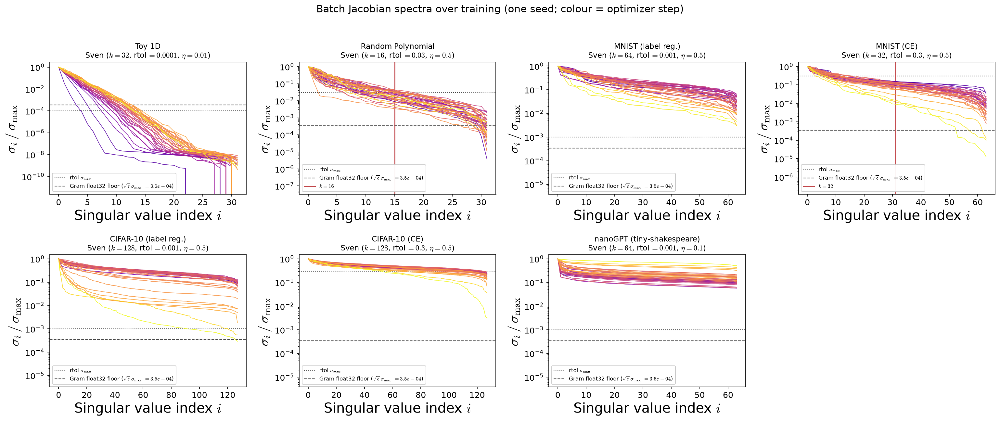

In [5]:
def panels(n, ncol=4, w=5.2, h=4.3, **kw):
    'A grid of n axes with the unused ones removed.'
    nrow = int(np.ceil(n / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=(w * ncol, h * nrow), **kw)
    axes = np.atleast_1d(axes).ravel()
    for ax in axes[n:]:
        ax.remove()
    return fig, axes[:n]


fig, axes = panels(len(DIAGS))
for ax, (scan, d) in zip(axes, DIAGS.items()):
    norm, _ = sf.plot_spectra_over_training(ax, d, arrays=ARRAYS[scan][:1], limit=45)
    lo, hi = ax.get_ylim()
    ax.set_ylim(lo / 60, hi)          # free space for the legend, below every line
    ax.set_title(f'{d.title}\n{d.label}', fontsize=11)
    ax.legend(fontsize=8, frameon=True, framealpha=0.95, loc='lower left')
fig.suptitle('Batch Jacobian spectra over training (one seed; colour = optimizer step)',
             y=1.01, fontsize=15)
fig.tight_layout()
print(sf.savefig(fig, PLOT_DIR, 'online_spectra_over_training')[0])
plt.show()

## 4. $|u_i^\top r|$: where the residual actually is (ONLINE)

The spectrum says how hard a direction is to move; this says how much residual is in
it. Only the two together decide whether the cut discards anything that mattered. Each
step is normalised by $\|U^\top r\|$ so steps with very different residual scales are
comparable. The sign of $u_i^\top r$ is arbitrary (`eigh` fixes none, and within a
degenerate $\sigma$ cluster the whole sub-basis is arbitrary), so only $|u_i^\top r|$ is
plotted.

plots_v2/spectra_analysis/online_utr_over_training.pdf


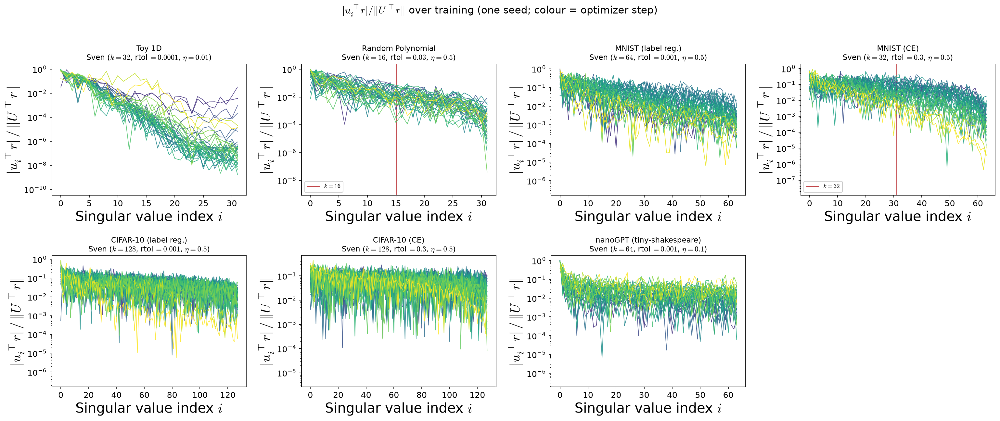

In [6]:
fig, axes = panels(len(DIAGS))
for ax, (scan, d) in zip(axes, DIAGS.items()):
    sf.plot_utr_over_training(ax, d, arrays=ARRAYS[scan][:1], limit=45)
    lo, hi = ax.get_ylim()
    ax.set_ylim(lo / 20, hi)
    ax.set_title(f'{d.title}\n{d.label}', fontsize=11)
    if d.truncates:
        ax.legend(fontsize=9, frameon=True, framealpha=0.95, loc='lower left')
fig.suptitle(r'$|u_i^\top r| / \|U^\top r\|$ over training (one seed; colour = optimizer step)',
             y=1.01, fontsize=15)
fig.tight_layout()
print(sf.savefig(fig, PLOT_DIR, 'online_utr_over_training')[0])
plt.show()

## 5. The mechanism plot: residual energy kept by the cut

$\sum_{i<k}(u_i^\top r)^2 / \|U^\top r\|^2$ — the fraction of **this batch's** residual
that survives the truncation — over training, seed-averaged with a $\pm1$ std band.
The dashed curve applies the rtol cut as well (`min(k, rtol-rank)` directions): where it
sits far below the solid one, it is `rtol`, not $k$, that is discarding residual.

plots_v2/spectra_analysis/online_energy_kept_vs_step.pdf


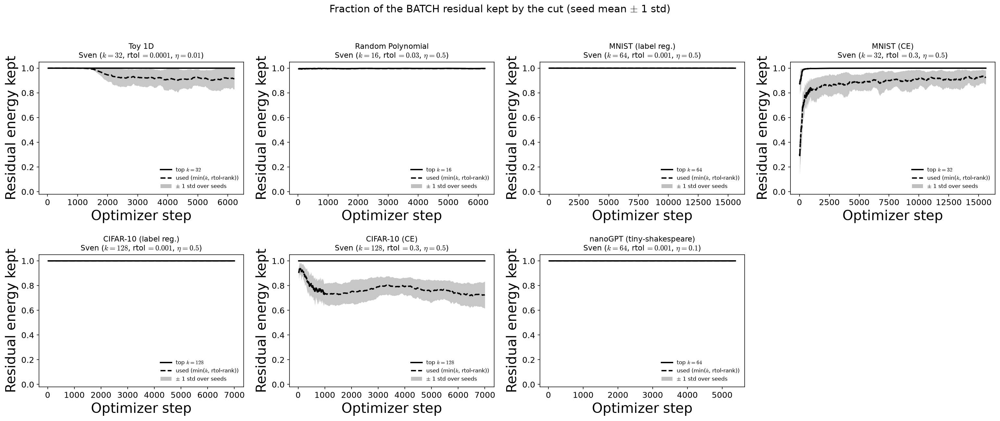

In [7]:
fig, axes = panels(len(DIAGS))
KEPT = {}
for ax, (scan, d) in zip(axes, DIAGS.items()):
    KEPT[scan] = sf.plot_energy_capture(ax, d, arrays=ARRAYS[scan], smooth=25)
    ax.set_title(f'{d.title}\n{d.label}', fontsize=11)
    ax.set_ylim(-0.02, 1.05)
    ax.legend(fontsize=8, frameon=False, loc='lower right')
fig.suptitle('Fraction of the BATCH residual kept by the cut (seed mean $\\pm$ 1 std)',
             y=1.01, fontsize=15)
fig.tight_layout()
print(sf.savefig(fig, PLOT_DIR, 'online_energy_kept_vs_step')[0])
plt.show()

The same thing on a log axis of what is **discarded**, $1-$ the fraction kept — the
differences that a linear axis flattens to "all of them are 1.0" are three to five
decades wide.

The x axis is **real training progress**, `svs_step / n_steps`, not the index of the
logged point: the dense schedule logs every step up to 1,000 and then every 20th, so
index fraction 0.5 is step 630 on toy — 10 % of training, not half of it — and the
distortion differs per scan (1,000 dense points of 1,262 on toy and polynomial, of
1,731 on MNIST, of 1,220 on nanoGPT). For the same reason the moving average is taken
over a fixed number of *steps* (`spectra_figs.smooth_steps`), not of samples: a
25-sample window would be 25 steps early and 500 steps late and the apparent sharpness
of each curve would change along it.


plots_v2/spectra_analysis/online_energy_discarded.pdf


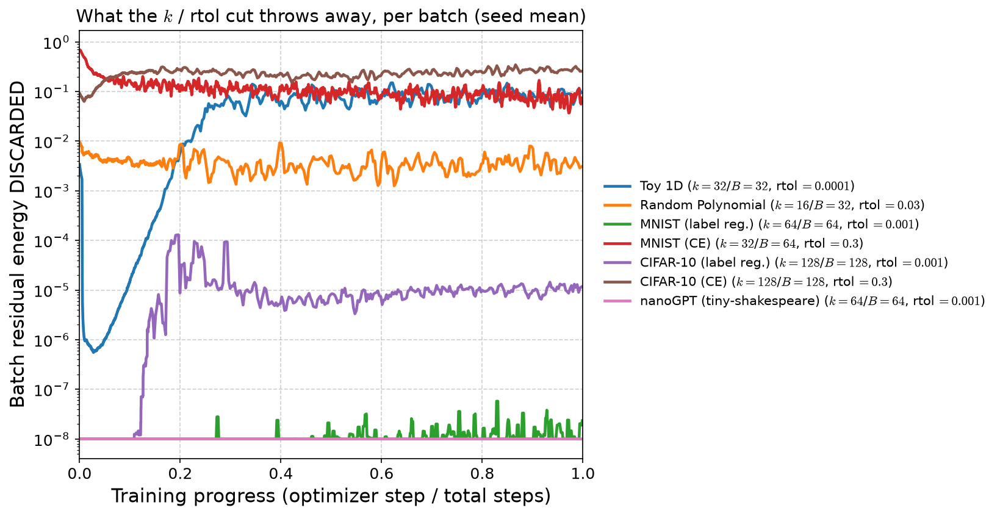


Batch residual energy discarded at fixed fractions of TRAINING (floor 1e-08 = nothing discarded):
                                 1%      10%      25%      50%     100%
Toy 1D                     9.75e-07 1.52e-05 4.57e-02 8.11e-02 9.48e-02
Random Polynomial          5.55e-03 4.37e-03 4.27e-03 5.08e-03 3.04e-03
MNIST (label reg.)         1.00e-08 1.00e-08 1.00e-08 1.00e-08 2.34e-08
MNIST (CE)                 4.80e-01 1.68e-01 1.33e-01 1.01e-01 7.41e-02
CIFAR-10 (label reg.)      1.00e-08 1.00e-08 1.19e-05 8.06e-06 1.16e-05
CIFAR-10 (CE)              6.73e-02 2.41e-01 2.48e-01 1.90e-01 2.57e-01
nanoGPT (tiny-shakespeare) 1.00e-08 1.00e-08 1.00e-08 1.00e-08 1.00e-08

Toy is the case an index-fraction axis mis-tells: it is at 1.52e-05 at 10 % of training and already 4.57e-02 at 25 %, ending at 9.48e-02 -- the rise is complete by 25% of training, not at 80 %.


In [8]:
FLOOR = 1e-8
SMOOTH_STEPS = 60      # the moving average is 60 OPTIMIZER STEPS wide everywhere
MARKS = (0.01, 0.1, 0.25, 0.5, 1.0)

fig, ax = plt.subplots(figsize=(11.0, 6.0))
DISCARDED = {}
for scan, d in DIAGS.items():
    step, mean, _, _ = sf.seed_stack(d.rows, 'frac_used', arrays=ARRAYS[scan])
    disc = np.clip(1.0 - mean, FLOOR, None)
    xs, ys = sf.smooth_steps(step, disc, SMOOTH_STEPS)
    prog = xs / d.n_steps
    ax.plot(prog, ys, lw=2.2,
            label=f'{d.title} ($k={d.k}$/$B={d.B}$, rtol$\\,={d.rtol:g}$)')
    # the numbers the old index-fraction axis got wrong: WHERE in training the cut
    # bites.  Read at fixed fractions of TRAINING, not of the logged-point index.
    DISCARDED[d.title] = {f'{m:.0%}': float(ys[np.argmin(np.abs(prog - m))])
                          for m in MARKS}
ax.axhline(FLOOR, color='0.5', lw=1, ls=':', zorder=0)
ax.set_yscale('log')
ax.set_xlim(0, 1)
ax.set_xlabel('Training progress (optimizer step / total steps)', fontsize=15)
ax.set_ylabel('Batch residual energy DISCARDED', fontsize=15)
ax.set_title('What the $k$ / rtol cut throws away, per batch (seed mean)', fontsize=14)
ax.tick_params(labelsize=12)
ax.legend(fontsize=10, frameon=False, loc='center left', bbox_to_anchor=(1.02, 0.5))
ax.grid(axis='both', linestyle='--', alpha=0.6)
fig.subplots_adjust(left=0.10, right=0.60, top=0.91, bottom=0.13)
print(sf.savefig(fig, PLOT_DIR, 'online_energy_discarded')[0])
plt.show()

DISC = pd.DataFrame(DISCARDED).T
print('\nBatch residual energy discarded at fixed fractions of TRAINING '
      f'(floor {FLOOR:g} = nothing discarded):')
print(DISC.to_string(float_format=lambda v: f'{v:.2e}'))
# the claim the index-fraction axis used to get wrong, stated from the table
toy = DISC.loc[sf_title] if (sf_title := DIAGS['toy_1d_scan'].title) in DISC.index else None
if toy is not None:
    rise = [c for c in DISC.columns if toy[c] > 10 * toy[DISC.columns[1]]]
    print(f"\nToy is the case an index-fraction axis mis-tells: it is at "
          f"{toy['10%']:.2e} at 10 % of training and already {toy['25%']:.2e} at 25 %, "
          f"ending at {toy['100%']:.2e}"
          + (f" -- the rise is complete by {rise[0]} of training, not at 80 %."
             if rise else '.'))


plots_v2/spectra_analysis/online_energy_profile.pdf


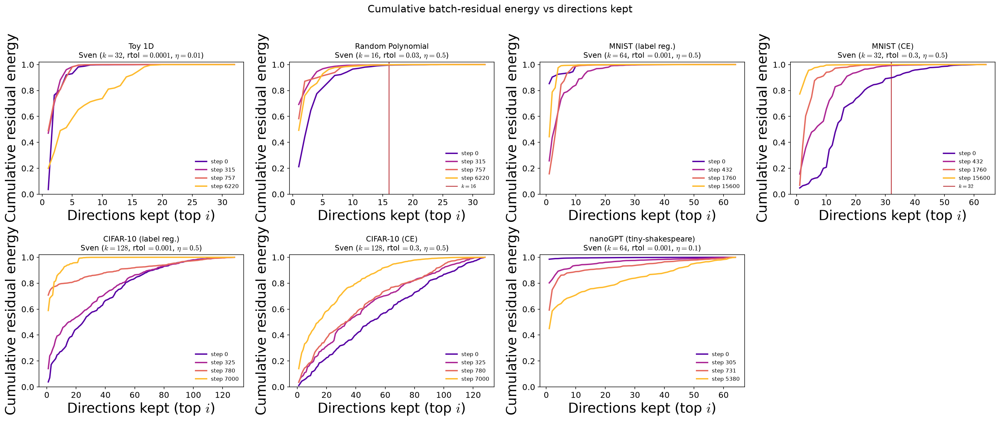

In [9]:
fig, axes = panels(len(DIAGS))
for ax, (scan, d) in zip(axes, DIAGS.items()):
    sf.plot_energy_profile(ax, d, arrays=ARRAYS[scan], fractions=(0.0, 0.25, 0.6, 1.0))
    ax.set_title(f'{d.title}\n{d.label}', fontsize=11)
    ax.legend(fontsize=8, frameon=False, loc='lower right')
fig.suptitle('Cumulative batch-residual energy vs directions kept', y=1.01, fontsize=15)
fig.tight_layout()
print(sf.savefig(fig, PLOT_DIR, 'online_energy_profile')[0])
plt.show()

In [10]:
worst = MECH.loc[MECH['energy_used_first'].idxmin()]
best = MECH.loc[MECH['energy_used_final'].idxmax()]
print('Within a batch, the cut is cheap almost everywhere:')
for _, r in MECH.iterrows():
    print(f"  {r['scan']:28s} k={int(r['k']):4d}/B={int(r['B']):4d} rtol={r['rtol']:<7g} "
          f"used {r['used_first']:6.1f} -> {r['used_final']:6.1f}  "
          f"batch residual kept {100 * r['energy_used_first']:7.3f}% -> "
          f"{100 * r['energy_used_final']:7.3f}%   ({r['binds']} binds)")
print(f"\nHardest early cut: {worst['scan']} keeps only "
      f"{100 * worst['energy_used_first']:.1f}% of the batch residual at the first logged "
      f"step (rtol = {worst['rtol']:g} leaves {worst['used_first']:.1f} of {int(worst['B'])} "
      f"directions) and still ends at {100 * worst['energy_used_final']:.1f}%.")
print(f"Loosest: {best['scan']} keeps {100 * best['energy_used_final']:.4f}%.")
print('\nSection 9 shows the SAME question answered on the fixed probe set, where the '
      'answer is very different.')

Within a batch, the cut is cheap almost everywhere:
  Toy 1D                       k=  32/B=  32 rtol=0.0001  used    4.2 ->   14.4  batch residual kept  92.082% ->  91.529%   (rtol binds)
  Random Polynomial            k=  16/B=  32 rtol=0.03    used    7.0 ->   13.4  batch residual kept  92.251% ->  99.586%   (rtol binds)
  MNIST (label reg.)           k=  64/B=  64 rtol=0.001   used   64.0 ->   63.6  batch residual kept 100.000% -> 100.000%   (neither ($k=B$) binds)
  MNIST (CE)                   k=  32/B=  64 rtol=0.3     used   10.0 ->    2.8  batch residual kept  31.006% ->  95.166%   (rtol binds)
  CIFAR-10 (label reg.)        k= 128/B= 128 rtol=0.001   used  128.0 ->   81.6  batch residual kept 100.000% ->  99.999%   (rtol binds)
  CIFAR-10 (CE)                k= 128/B= 128 rtol=0.3     used  106.0 ->   36.6  batch residual kept  90.131% ->  76.695%   (rtol binds)
  nanoGPT (tiny-shakespeare)   k=  64/B=  64 rtol=0.001   used   64.0 ->   64.0  batch residual kept 100.000% -> 10

## 6. Rank actually used — vs $k$ and vs `rtol`

Per step (ONLINE) for the selected configuration, and then over the whole $(k,\,\mathrm{rtol})$
grid of the tuning scan. The grid table reads `svd_summary['num_nonzero_svs_epoch']`
straight from the light records — no `diag/` reads — so it covers every grid point.
`used/k = 1` means $k$ is the binding cut; below 1 means `rtol` is.

**Every cell says how many seeds it rests on.** Sven diverges on 688 of 7,825 on-grid
runs, concentrated at the bottom of each rtol grid (`EXPERIMENTS.md` §7), so the
low-`rtol` corner of this figure is exactly where the seed count collapses: a cell with
fewer than the full complement carries `n_seeds/attempted` under its value and is
hatched in red. A cell that is blank had no runs at all (the CIFAR-CE `rtol` extension
was launched at `k=128` only, so its `k=64` row stops at `rtol` $=10^{-2}$), and a cell
printed as `0/n` had runs of which none survived.


plots_v2/spectra_analysis/online_rank_used_vs_step.pdf


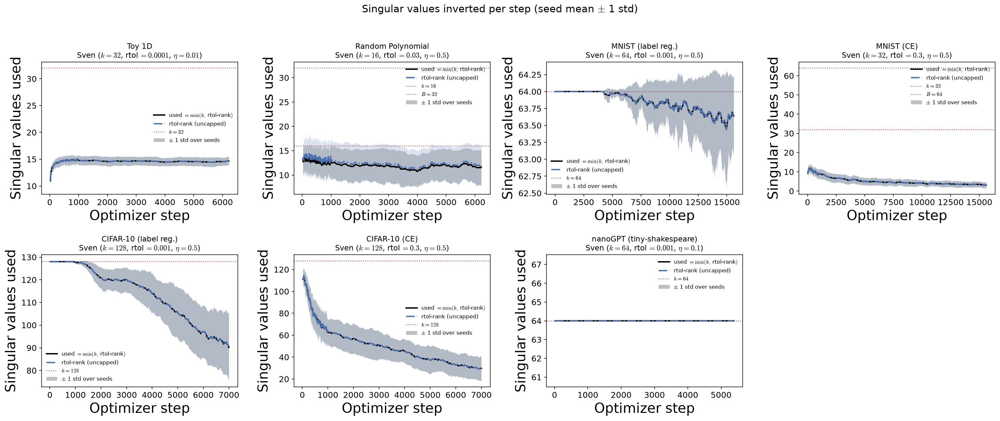

In [11]:
fig, axes = panels(len(DIAGS))
for ax, (scan, d) in zip(axes, DIAGS.items()):
    sf.plot_rank_used(ax, d, arrays=ARRAYS[scan], smooth=25)
    ax.set_title(f'{d.title}\n{d.label}', fontsize=11)
    ax.legend(fontsize=8, frameon=False, loc='best')
fig.suptitle('Singular values inverted per step (seed mean $\\pm$ 1 std)', y=1.01, fontsize=15)
fig.tight_layout()
print(sf.savefig(fig, PLOT_DIR, 'online_rank_used_vs_step')[0])
plt.show()

Loaded 1770 runs from ../experiment_results/_cache/toy_1d_scan.slim.pkl (slim cache)


Loaded 1630 runs from ../experiment_results/_cache/polynomial_scan.slim.pkl (slim cache)
Loaded 1360 runs from ../experiment_results/_cache/mnist_scan_labelRegression.slim.pkl (slim cache)


Loaded 1610 runs from ../experiment_results/_cache/mnist_scan_ce.slim.pkl (slim cache)
Loaded 600 runs from ../experiment_results/_cache/cifar10_resnet_scan_labelRegression.slim.pkl (slim cache)


Loaded 785 runs from ../experiment_results/_cache/cifar10_resnet_ce_scan.slim.pkl (slim cache)
Loaded 140 runs from ../experiment_results/_cache/exp_nanogpt_speedrun.slim.pkl (slim cache)


plots_v2/spectra_analysis/online_used_rank_grid.pdf


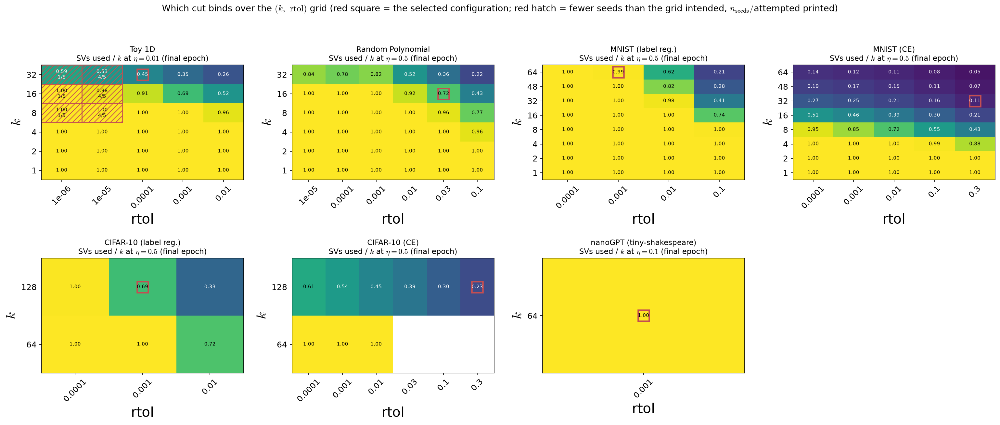

In [12]:
from matplotlib.patches import Rectangle

GRIDS = {}
for scan, d in DIAGS.items():
    g = sf.used_rank_grid(scan, lr=d.lr)
    if len(g):
        GRIDS[scan] = g

fig, axes = panels(len(GRIDS))
for ax, (scan, g) in zip(axes, GRIDS.items()):
    d = DIAGS[scan]
    full = int(g['n_records'].max())          # the intended seed count of this grid
    piv = g.pivot(index='k', columns='rtol', values='used_frac_k').sort_index(ascending=False)
    nsd = g.pivot(index='k', columns='rtol', values='n_seeds').reindex(
        index=piv.index, columns=piv.columns)
    att = g.pivot(index='k', columns='rtol', values='n_records').reindex(
        index=piv.index, columns=piv.columns)
    im = ax.imshow(piv.to_numpy(), vmin=0, vmax=1, cmap='viridis', aspect='auto')
    ax.set_xticks(range(len(piv.columns)), [f'{c:g}' for c in piv.columns], rotation=45)
    ax.set_yticks(range(len(piv.index)), [int(i) for i in piv.index])
    ax.set_xlabel('rtol')
    ax.set_ylabel('$k$')
    ax.set_title(f'{d.title}\nSVs used / $k$ at $\\eta={d.lr:g}$ (final epoch)', fontsize=11)
    for yi in range(len(piv.index)):
        for xi in range(len(piv.columns)):
            v = piv.to_numpy()[yi, xi]
            ns, at = nsd.to_numpy()[yi, xi], att.to_numpy()[yi, xi]
            if not np.isfinite(v):
                if np.isfinite(at):          # runs exist, none of them usable
                    ax.text(xi, yi, f'0/{int(at)}', ha='center', va='center',
                            fontsize=7, color='#C44E52')
                continue
            short = np.isfinite(ns) and int(ns) < full
            ax.text(xi, yi, f'{v:.2f}' + (f'\n{int(ns)}/{int(at)}' if short else ''),
                    ha='center', va='center', fontsize=7,
                    color='w' if v < 0.6 else 'k')
            if short:
                ax.add_patch(Rectangle((xi - 0.5, yi - 0.5), 1, 1, fill=False,
                                       hatch='///', edgecolor='#C44E52', lw=1.2))
    if np.isclose(d.rtol, np.asarray(piv.columns, float)).any() and d.k in list(piv.index):
        ax.plot(int(np.argmin(np.abs(np.asarray(piv.columns, float) - d.rtol))),
                list(piv.index).index(d.k), marker='s', ms=16, mfc='none',
                mec='#C44E52', mew=2.2)
fig.suptitle('Which cut binds over the $(k,\\ \\mathrm{rtol})$ grid '
             '(red square = the selected configuration; red hatch = fewer seeds than '
             'the grid intended, $n_{\\mathrm{seeds}}/$attempted printed)',
             y=1.02, fontsize=13)
fig.tight_layout()
print(sf.savefig(fig, PLOT_DIR, 'online_used_rank_grid')[0])
plt.show()


In [13]:
# the honest accounting behind the hatching: which cells are short, and why
SHORT = []
for scan, g in GRIDS.items():
    full = int(g['n_records'].max())
    for _, r in g.iterrows():
        if int(r['n_seeds']) < full:
            SHORT.append({'scan': DIAGS[scan].title, 'k': int(r['k']), 'rtol': r['rtol'],
                          'used/k': r['used_frac_k'], 'finished/attempted': r['counts'],
                          'diverged': int(r['n_diverged']),
                          'not landed': full - int(r['n_records'])})
SHORT = pd.DataFrame(SHORT)
if len(SHORT):
    print(SHORT.to_string(index=False, formatters={'rtol': '{:g}'.format,
                                                   'used/k': '{:.4f}'.format}))
else:
    print('every cell of every grid rests on the full seed complement')
print('\n"diverged" = excluded by the divergence rule (status or the 10x rule);')
# Read off the table rather than asserted: the CIFAR-CE rtol extension that used to put
# rows here has landed (45/45), so "not landed" is now 0 on every cell of every grid.
_nl = int(SHORT['not landed'].sum()) if len(SHORT) else 0
print(f'"not landed" = intended by the plan but no record yet ({_nl} in total'
      + ('; every short cell above is short because runs DIVERGED, not because a run is '
         'missing' if _nl == 0 else '') + ').')
print('Cells absent from a grid were never launched:')
for scan, g in GRIDS.items():
    ks, rtols = sorted(g['k'].unique()), sorted(g['rtol'].unique())
    missing = [(int(k), r) for k in ks for r in rtols
               if not len(g[(g['k'] == k) & np.isclose(g['rtol'], r)])]
    if missing:
        print(f"  {DIAGS[scan].title}: no runs at " +
              ', '.join(f'k={k}/rtol={r:g}' for k, r in missing))


  scan  k  rtol used/k finished/attempted  diverged  not landed
Toy 1D  8 1e-06 1.0000                1/5         4           0
Toy 1D  8 1e-05 1.0000                4/5         1           0
Toy 1D 16 1e-06 1.0000                1/5         4           0
Toy 1D 16 1e-05 0.9751                4/5         1           0
Toy 1D 32 1e-06 0.5905                1/5         4           0
Toy 1D 32 1e-05 0.5348                4/5         1           0

"diverged" = excluded by the divergence rule (status or the 10x rule);
"not landed" = intended by the plan but no record yet (0 in total; every short cell above is short because runs DIVERGED, not because a run is missing).
Cells absent from a grid were never launched:
  CIFAR-10 (CE): no runs at k=64/rtol=0.03, k=64/rtol=0.1, k=64/rtol=0.3


## 7. Update and residual norms (ONLINE)

`update_norm` is the **applied** parameter change $\|\theta_{t+1}-\theta_t\| = \|\eta\,\delta\|$
(divide by the run's $\eta$ for the raw solve); `resid_norm` is $\|r\|$ on the batch.
Together they say whether Sven's steps shrink because the residual shrank or because the
solve shrank relative to it.

plots_v2/spectra_analysis/online_update_resid_norms.pdf


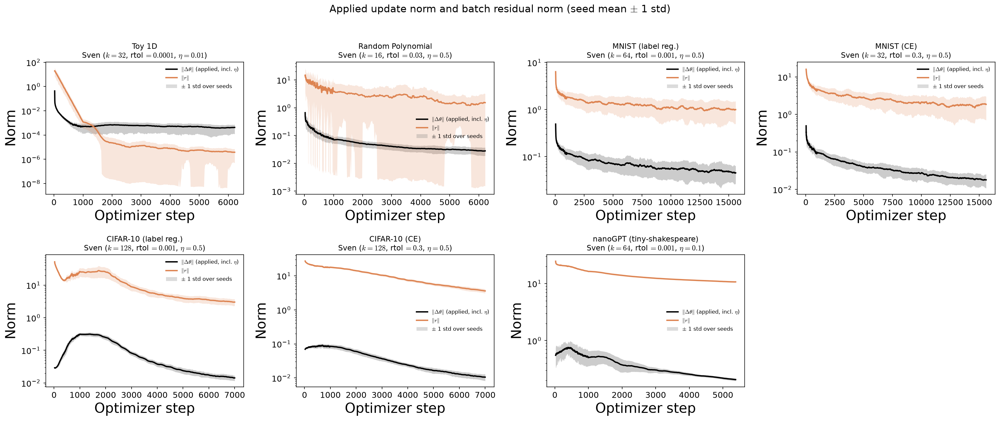

In [14]:
fig, axes = panels(len(DIAGS))
for ax, (scan, d) in zip(axes, DIAGS.items()):
    sf.plot_norms(ax, d, arrays=ARRAYS[scan], smooth=25)
    ax.set_title(f'{d.title}\n{d.label}', fontsize=11)
    ax.legend(fontsize=8, frameon=False, loc='best')
fig.suptitle('Applied update norm and batch residual norm (seed mean $\\pm$ 1 std)',
             y=1.01, fontsize=15)
fig.tight_layout()
print(sf.savefig(fig, PLOT_DIR, 'online_update_resid_norms')[0])
plt.show()

In [15]:
rows = []
for scan, d in DIAGS.items():
    a = ARRAYS[scan]
    for key in ('update_norm', 'resid_norm'):
        first = np.nanmean([x[key][0] for x in a])
        last = np.nanmean([x[key][-1] for x in a])
        rows.append({'scan': d.title, 'quantity': key, 'first': first, 'final': last,
                     'ratio': last / first if first else np.nan})
NORMS = pd.DataFrame(rows).pivot(index='scan', columns='quantity',
                                 values=['first', 'final', 'ratio'])
print(NORMS.round(5).to_string())
print('\nratio < 1 means the quantity SHRANK over training; Sven ends with a smaller '
      'applied step on every scan, but the residual it is solving against shrinks by '
      'very different factors.')

                                first                  final                  ratio            
quantity                   resid_norm update_norm resid_norm update_norm resid_norm update_norm
scan                                                                                           
CIFAR-10 (CE)                29.82947     0.06825    3.21616     0.01154    0.10782     0.16906
CIFAR-10 (label reg.)        87.80761     0.03377    3.11755     0.01705    0.03550     0.50483
MNIST (CE)                   18.51415     2.34268    1.62626     0.01556    0.08784     0.00664
MNIST (label reg.)            9.46920     0.56777    0.82896     0.03922    0.08754     0.06909
Random Polynomial             7.26108     3.86249    0.53697     0.03337    0.07395     0.00864
Toy 1D                        9.47649     4.48854    0.00000     0.00035    0.00000     0.00008
nanoGPT (tiny-shakespeare)   34.64544     0.50769   10.69722     0.20141    0.30876     0.39671

ratio < 1 means the quantity SHRANK ove

## 8. Seed variability (ONLINE)

All five model seeds of the selected configuration, per scan: how much of the above is
seed-independent. The band in the figures is $\pm1$ std over these seeds.

                      scan                    quantity     mean      std      min       max  rel_spread  n_seeds
                    Toy 1D            SVs used (final) 14.40000  1.14018 13.00000  16.00000     0.07918        5
                    Toy 1D batch residual kept (final)  0.91529  0.08791  0.78128   0.99121     0.09605        5
                    Toy 1D applied update norm (final)  0.00035  0.00036  0.00003   0.00095     1.03928        5
         Random Polynomial            SVs used (final) 13.40000  1.81659 11.00000  16.00000     0.13557        5
         Random Polynomial batch residual kept (final)  0.99586  0.00195  0.99328   0.99850     0.00196        5
         Random Polynomial applied update norm (final)  0.03337  0.00991  0.02147   0.04827     0.29709        5
        MNIST (label reg.)            SVs used (final) 63.60000  0.54772 63.00000  64.00000     0.00861        5
        MNIST (label reg.) batch residual kept (final)  1.00000  0.00000  1.00000   1.00000     

plots_v2/spectra_analysis/online_rank_used_per_seed.pdf


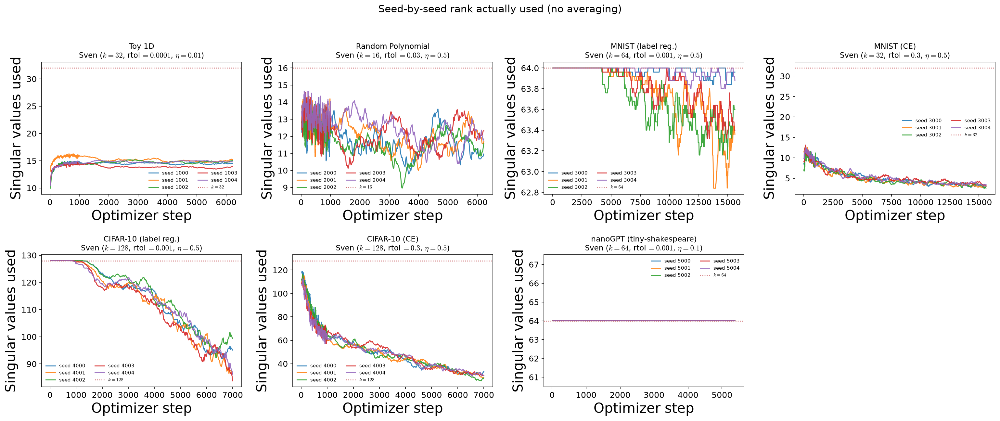

In [16]:
rows = []
for scan, d in DIAGS.items():
    for key, name in (('used_rank', 'SVs used (final)'),
                      ('frac_used', 'batch residual kept (final)'),
                      ('update_norm', 'applied update norm (final)')):
        vals = np.array([a[key][-1] for a in ARRAYS[scan]], dtype=float)
        rows.append({'scan': d.title, 'quantity': name, 'mean': vals.mean(),
                     'std': vals.std(ddof=1), 'min': vals.min(), 'max': vals.max(),
                     'rel_spread': vals.std(ddof=1) / abs(vals.mean()) if vals.mean() else np.nan,
                     'n_seeds': len(vals)})
SEEDVAR = pd.DataFrame(rows)
print(SEEDVAR.round(5).to_string(index=False))

fig, axes = panels(len(DIAGS))
for ax, (scan, d) in zip(axes, DIAGS.items()):
    for a, seed in zip(ARRAYS[scan], d.seeds):
        step, y = a['step'], a['used_rank'].astype(float)
        ys, idx = sv.smooth(y, 25)
        ax.plot(step[idx], ys, lw=1.4, alpha=0.9, label=f'seed {seed}')
    ax.axhline(d.k, color='#C44E52', lw=1.2, ls=':', label=f'$k={d.k}$')
    ax.set_xlabel('Optimizer step')
    ax.set_ylabel('Singular values used')
    ax.set_title(f'{d.title}\n{d.label}', fontsize=11)
    ax.legend(fontsize=7, frameon=False, ncol=2)
fig.suptitle('Seed-by-seed rank actually used (no averaging)', y=1.01, fontsize=15)
fig.tight_layout()
print(sf.savefig(fig, PLOT_DIR, 'online_rank_used_per_seed')[0])
plt.show()

## 9. The fixed probe set (OFFLINE, float64)

Now the other measurement: the float64 Jacobian of the **same rows** at every logged
checkpoint, along the trajectories of Sven, Adam, MuonW and HIG
(`tools/compute_ckpt_spectra.py`, cached under `analysis/ckpt_spectra/`). Same rows,
same row definition (`ckpt_tools.row_spec_for_scan` raises if a scan's runs disagree),
same dtype for every optimizer — so these trajectories are comparable and the rank axis
runs to $\min(n_\text{rows}, P)$ instead of to $B$.

Toy and polynomial use the whole 10,000-example pool (so the "probe set" is the training
pool) and the width is then set by $P$ — 593 and 673 columns. MNIST uses a 512-row
subsample drawn with the runner's own `subsample_indices`, bit-identical across every run
of the scan, so there the width is 512 rows and **not** $P=27{,}562$. The inventory below
is printed under the same filters (`n_probe=-1`, `epochs_only=False`) that
`probe_metrics` applies, so the counts are the ones every table in this section is
computed from; `n_cached_any_tag` is the raw file count, which is larger wherever an
extra probe tag exists (MNIST label-reg also has 4 `probe2000_epochs` files).


In [17]:
import ckpt_tools as ct

PROBE_SCANS = {}
for scan in headline.HEADLINE_SCANS:
    try:
        ms = sf.probe_methods(scan)
    except Exception as exc:                      # no cache for this scan
        ms = []
        print(f'  [skip] {scan}: {exc}')
    if ms:
        PROBE_SCANS[scan] = ms
if not PROBE_SCANS:
    print('no cached probe spectra; run tools/compute_ckpt_spectra.py <scan> first')
else:
    WIDTHS = sf.probe_widths(PROBE_SCANS)
    print(WIDTHS.to_string(index=False))
    print('\nwidth is the MEASURED svals.shape[1]; n_used is what probe_metrics reads.')
    for scan, ms in PROBE_SCANS.items():
        print(f'  {scan:34s} methods {ms}')


                      scan  n_rows  n_params  width  n_ckpts  methods  seeds  n_used  n_cached_any_tag
               toy_1d_scan   10000       593    593       34        4      5      20                20
           polynomial_scan   10000       673    673       34        4      5      20                20
mnist_scan_labelRegression     512     27562    512       35        4      5      20                24
             mnist_scan_ce     512     27562    512       35        4      5      20                20

width is the MEASURED svals.shape[1]; n_used is what probe_metrics reads.
  toy_1d_scan                        methods ['Sven', 'Adam', 'MuonW', 'HIG']
  polynomial_scan                    methods ['Sven', 'Adam', 'MuonW', 'HIG']
  mnist_scan_labelRegression         methods ['Sven', 'Adam', 'MuonW', 'HIG']
  mnist_scan_ce                      methods ['Sven', 'Adam', 'MuonW', 'HIG']


In [18]:
PROBE = {scan: sf.probe_metrics(scan, methods=ms) for scan, ms in PROBE_SCANS.items()}
for scan, tbl in PROBE.items():
    # one probe set per scan: every method starts from the SAME checkpoint, so step 0
    # must be identical across methods -- that is the check that they are comparable
    at0 = tbl[tbl['step'] == 0].groupby('method')[['sigma_max', 'probe_loss', 'param_norm']].mean()
    spread = float((at0.max() - at0.min()).abs().max())
    print(f'{scan:34s} n_rows={tbl["n_rows"].iloc[0]:6d} P={tbl["n_params"].iloc[0]:6d} '
          f'ckpts={tbl["step"].nunique():3d}  max spread between methods at step 0: {spread:.2e}')

toy_1d_scan                        n_rows= 10000 P=   593 ckpts= 34  max spread between methods at step 0: 0.00e+00
polynomial_scan                    n_rows= 10000 P=   673 ckpts= 34  max spread between methods at step 0: 0.00e+00
mnist_scan_labelRegression         n_rows=   512 P= 27562 ckpts= 35  max spread between methods at step 0: 0.00e+00
mnist_scan_ce                      n_rows=   512 P= 27562 ckpts= 35  max spread between methods at step 0: 0.00e+00


### 9.1 Spectrum evolution along each optimizer's trajectory

**One seed per panel, not a seed average** — the same rule as the online spectra in
section 3, and for a stronger reason: each seed's probe spectrum is conditioned on that
seed's initialisation, so averaging five of them draws a matrix no trajectory had. The
seed drawn is named in the corner of every panel (`spectra_figs.plot_probe_spectra`
warns if a caller lets it pick silently). Five seeds are cached per (scan, method); the
seed-averaged quantities are the metrics in §9.2 and the energy profiles in §9.4.


plots_v2/spectra_analysis/probe_spectra_toy_1d_scan.pdf


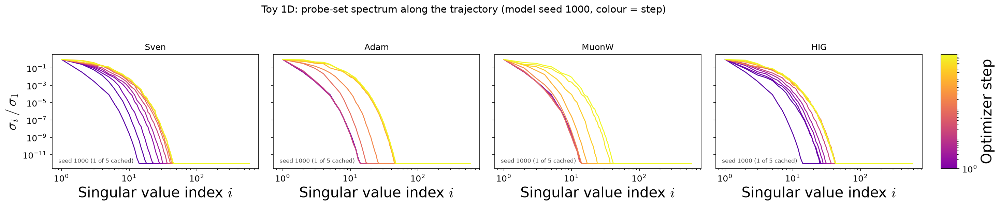

plots_v2/spectra_analysis/probe_spectra_polynomial_scan.pdf


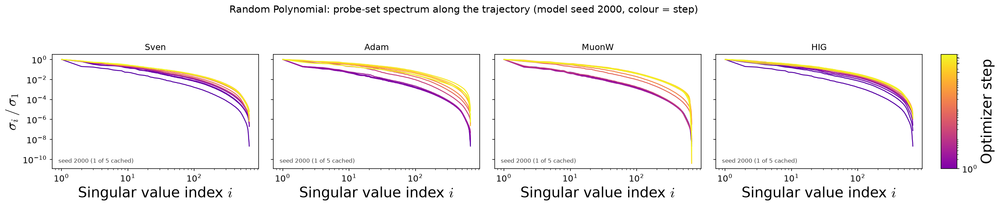

plots_v2/spectra_analysis/probe_spectra_mnist_scan_labelRegression.pdf


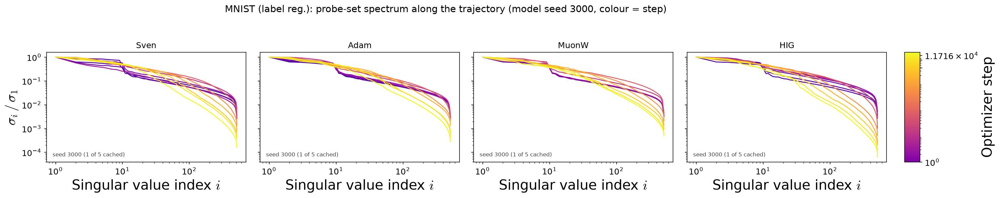

plots_v2/spectra_analysis/probe_spectra_mnist_scan_ce.pdf


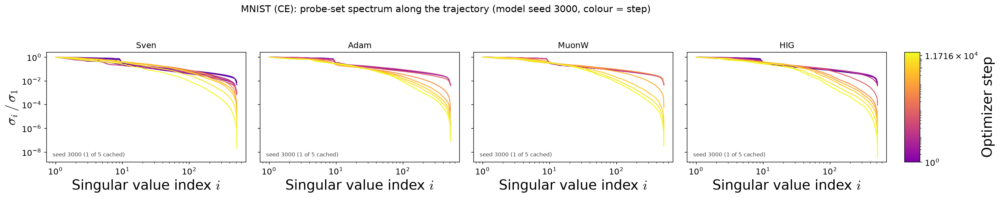

In [19]:
for scan, methods in PROBE_SCANS.items():
    seed = min(int(e['model_seed'])
               for e in ct.load_spectra(sf.probe_scan_name(scan), n_probe=-1,
                                        epochs_only=False))
    fig, axes = panels(len(methods), ncol=4, w=4.6, h=4.0, sharey=True)
    norm = None
    for ax, method in zip(axes, methods):
        norm = sf.plot_probe_spectra(ax, scan, method, seed=seed, limit=14) or norm
        ax.set_title(style.method_label(method), fontsize=12)
    for ax in axes[1:]:
        ax.set_ylabel('')
    fig.suptitle(f'{headline.scan_title(scan)}: probe-set spectrum along the trajectory '
                 f'(model seed {seed}, colour = step)', y=1.02, fontsize=14)
    fig.tight_layout()
    if norm is not None:
        sv.epoch_colorbar(fig, axes[-1], norm, label='Optimizer step')
    print(sf.savefig(fig, PLOT_DIR, f'probe_spectra_{scan}')[0])
    plt.show()


### 9.2 Effective rank, condition number and $\sigma_B/\sigma_1$ over training

`eff_rank` is $\exp(H(\sigma))$ with $p_i=\sigma_i/\sum\sigma$ (Roy & Vetterli): it is $r$
for a flat rank-$r$ spectrum and falls smoothly as the spectrum concentrates, so it can
be tracked where a thresholded numerical rank only gives a step function. It uses the
whole spectrum and is the only one of the three that is floor-free.

`cond` and $\sigma_B/\sigma_1$ are **bounded by the resolution threshold, not only by
the data**, and the figures now say where:

* `cond` is taken over the resolved part ($\sigma>10^{-12}\sigma_{\max}$), so it can
  never exceed the dashed ceiling at $10^{12}$. On **toy** the Jacobian is strongly
  rank-deficient — 14 of 593 directions above the threshold at step 0, rising to 45,
  against a raw $\sigma_{\min}/\sigma_{\max}$ of $1.3\times10^{-17}$ — so its `cond`
  ($4.4\times10^{11}\to6.8\times10^{11}$) sits within a factor of two of the ceiling
  and is measuring the threshold. Polynomial ($673$ of $673$ resolved) and both MNIST
  scans ($512$ of $512$) are genuine.
* $\sigma_B/\sigma_1$ is the damping at Sven's batch cut, but only where index $B$ is
  *inside* the resolved rank. Where it is not — toy again, whose $\sigma_{32}$ of a
  numerically rank-14 spectrum does not exist and reads $9.5\times10^{-17}$ — the point
  is drawn as a hollow ring and must not be read as damping. The float64 probe floor is
  drawn dashed.


plots_v2/spectra_analysis/probe_eff_rank.pdf


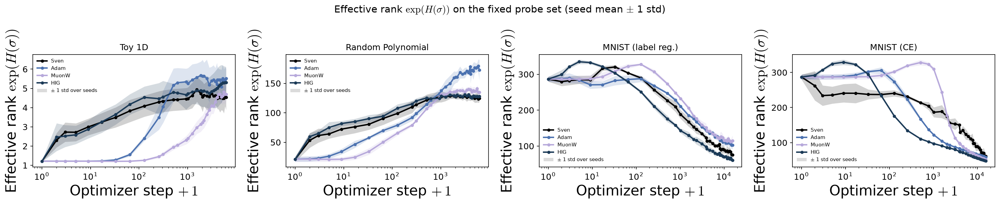

plots_v2/spectra_analysis/probe_cond.pdf


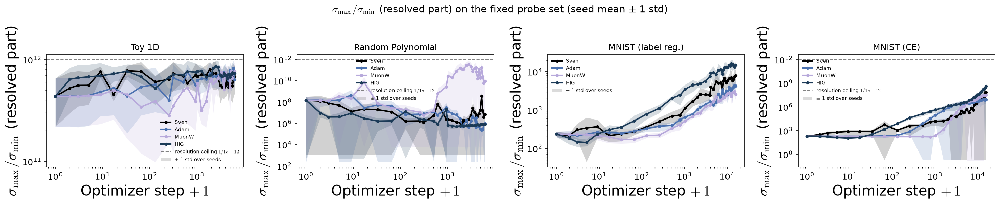

plots_v2/spectra_analysis/probe_sigma_B_over_1.pdf


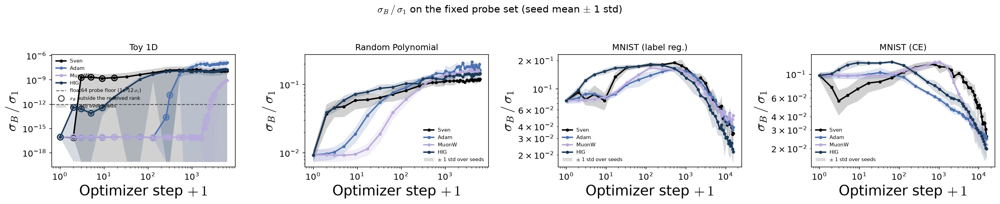

              scan  width  resolved rank first  resolved rank final  sigma_B index  sigma_B resolved (all ckpts)  cond final  ceiling 1/floor
            Toy 1D    593                   14                   45             32                         False    6.75e+11            1e+12
 Random Polynomial    673                  673                  673             32                          True    6.92e+06            1e+12
MNIST (label reg.)    512                  512                  512             64                          True    7.92e+03            1e+12
        MNIST (CE)    512                  512                  512             64                          True    7.07e+07            1e+12

A scan whose resolved rank equals its width has a fully resolved spectrum and
a meaningful cond; toy does not, and its cond / sigma_B panels are floor-limited.


In [20]:
for metric, logy in (('eff_rank', False), ('cond', True), ('sigma_B_over_1', True)):
    fig, axes = panels(len(PROBE), ncol=4, w=5.0, h=4.0)
    for ax, (scan, tbl) in zip(axes, PROBE.items()):
        sf.plot_probe_metric(ax, tbl, metric, methods=PROBE_SCANS[scan], logy=logy)
        ax.set_title(headline.scan_title(scan), fontsize=12)
        ax.legend(fontsize=7, frameon=False)
    fig.suptitle(sf.PROBE_METRIC_LABELS[metric] + ' on the fixed probe set '
                 '(seed mean $\\pm$ 1 std)', y=1.02, fontsize=14)
    fig.tight_layout()
    print(sf.savefig(fig, PLOT_DIR, f'probe_{metric}')[0])
    plt.show()

# the resolution accounting that decides which panels above are measurements
rows = []
for scan, tbl in PROBE.items():
    sub = tbl[tbl['method'] == 'Sven']
    first = sub[sub['step'] == sub['step'].min()]
    last = sub[sub['step'] == sub['step'].max()]
    rows.append({'scan': headline.scan_title(scan),
                 'width': int(sub['n_rows'].min()) if sub['n_rows'].iloc[0] < sub['n_params'].iloc[0]
                 else int(sub['n_params'].iloc[0]),
                 'resolved rank first': first['rank'].mean(),
                 'resolved rank final': last['rank'].mean(),
                 'sigma_B index': int(sub['sigma_b'].iloc[0]),
                 'sigma_B resolved (all ckpts)': bool(sub['sigma_b_resolved'].all()),
                 'cond final': last['cond'].mean(),
                 'ceiling 1/floor': 1.0 / float(sub['floor'].iloc[0])})
RESOLUTION = pd.DataFrame(rows)
print(RESOLUTION.to_string(index=False, float_format=lambda v: f'{v:.3g}'))
print('\nA scan whose resolved rank equals its width has a fully resolved spectrum and')
print('a meaningful cond; toy does not, and its cond / sigma_B panels are floor-limited.')


### 9.3 Codex Low 4: does Sven stay closer to initialisation / find smaller-norm solutions?

$\|\theta_t-\theta_0\|$ and $\|\theta_t\|$ at the last cached checkpoint, seed mean, with
Sven's rank among the four trajectories. The verdict below is computed from the table,
not asserted — including where it comes out **no**.

A rank is not a result on its own, so each row also carries the **paired per-seed
difference** between Sven and the best other method (same `model_seed` = same
initialisation and the same probe rows on both sides) with a 95 % Student-t interval, and
`resolved` says whether that interval excludes zero. A rank of 1 that is **not resolved**
is not a win: MNIST label-regression is that case — Sven 12.476 against HIG 12.518, a
gap six times smaller than the seed stds (0.27 / 0.34), paired $-0.042\pm0.20$ with 2 of
5 seeds going the other way.

With five seeds the interval is wide, so most of these comparisons come out unresolved.
That, not a ranking, is the answer to Codex Low 4, and it is what the verdict prints.


plots_v2/spectra_analysis/probe_distance_and_norm.pdf


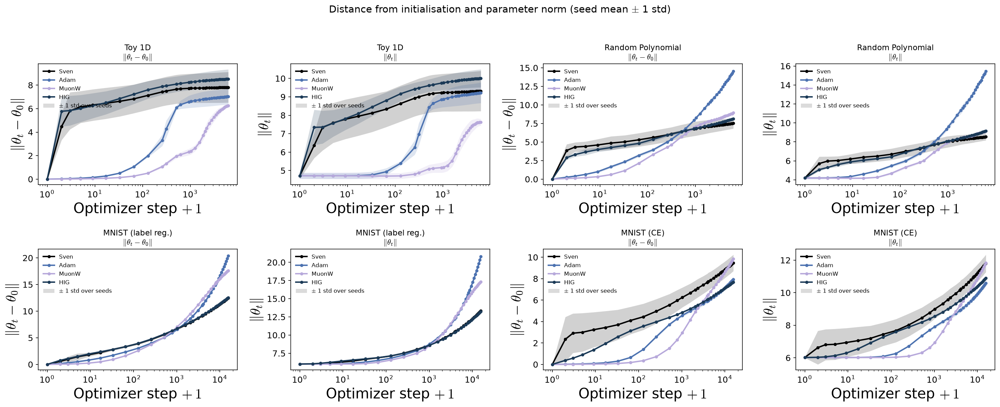

In [21]:
fig, axes = panels(2 * len(PROBE), ncol=4, w=5.0, h=4.0)
for i, (scan, tbl) in enumerate(PROBE.items()):
    for j, metric in enumerate(('dist_init', 'param_norm')):
        ax = axes[2 * i + j]
        sf.plot_probe_metric(ax, tbl, metric, methods=PROBE_SCANS[scan], logy=False)
        ax.set_title(f'{headline.scan_title(scan)}\n{sf.PROBE_METRIC_LABELS[metric]}',
                     fontsize=11)
        ax.legend(fontsize=8, frameon=False)
fig.suptitle('Distance from initialisation and parameter norm (seed mean $\\pm$ 1 std)',
             y=1.01, fontsize=14)
fig.tight_layout()
print(sf.savefig(fig, PLOT_DIR, 'probe_distance_and_norm')[0])
plt.show()

In [22]:
LOW4 = sf.low4_table(PROBE)
print(LOW4.to_string(index=False, float_format=lambda v: f'{v:.4g}'))

print('\nVerdict. The rank of the mean AND whether the paired seed interval resolves')
print('it -- a rank of 1 whose 95% interval covers zero is NOT a win:')
for metric in ('dist_init', 'param_norm'):
    print(sf.low4_verdict(LOW4, metric))
print('\nSo the claim is scan-dependent, not general: state it per scan, never as '
      '"Sven stays closer to init".')


              scan     metric  Sven  Sven_std  rank  n_methods best_other  best_other_mean  paired_mean  paired_std  paired_half  n_paired  n_ref_lower  resolved                 verdict  n_seeds
            Toy 1D  dist_init  7.82     1.303     3          4      MuonW            6.259         1.56       1.415        1.757         5            0     False   larger (not resolved)        5
            Toy 1D param_norm 9.316     1.093     3          4      MuonW             7.62        1.696       1.154        1.433         5            0      True                  larger        5
 Random Polynomial  dist_init 7.524    0.7054     1          4        HIG             8.12      -0.5968      0.5832       0.7241         5            4     False smallest (not resolved)        5
 Random Polynomial param_norm 8.545    0.3735     1          4        HIG            9.134      -0.5895      0.2685       0.3334         5            5      True                smallest        5
MNIST (label reg.)  dist_

### 9.4 What the truncation throws away, measured on the probe set

The online figures say the $k$ cut keeps ~100 % of a **batch** residual. On the probe
set the same $k$ is a cut of a far wider spectrum, and the answer changes. Two
normalisations, because they answer different questions:

* `in_span` $=\|P_Ur\|^2/\|r\|^2$ — how much of the residual the Jacobian's column space
  can reach **at all**. Below 1 only where the probe set has more rows than the model has
  parameters (toy, polynomial: 10,000 rows, ~600 parameters); that shortfall is
  unreachable by *any* optimizer, Sven or not.
* `top_k` — the fraction of the reachable residual inside the leading $k$ directions:
  what Sven's truncation keeps.

In [23]:
rows = []
for scan, methods in PROBE_SCANS.items():
    if 'Sven' not in methods:
        continue
    d = DIAGS[scan]
    ks = sorted({8, 16, 32, d.k, d.B})
    tbl = sf.probe_energy(scan, ks=ks)
    tbl.insert(0, 'scan', headline.scan_title(scan))
    tbl.insert(1, 'k_selected', d.k)
    tbl.insert(2, 'B', d.B)
    rows.append(tbl)
PROBE_ENERGY = pd.concat(rows, ignore_index=True) if rows else pd.DataFrame()
print(PROBE_ENERGY.round(6).to_string(index=False))

              scan  k_selected  B  when  step  k    top_k  top_k_std  in_span  n_seeds
            Toy 1D          32 32 first     0  8 0.995782   0.001950 1.000000        5
            Toy 1D          32 32 first     0 16 1.000000   0.000000 1.000000        5
            Toy 1D          32 32 first     0 32 1.000000   0.000000 1.000000        5
            Toy 1D          32 32  last  6240  8 0.641686   0.130312 1.000000        5
            Toy 1D          32 32  last  6240 16 0.769419   0.105510 1.000000        5
            Toy 1D          32 32  last  6240 32 1.000000   0.000000 1.000000        5
 Random Polynomial          16 32 first     0  8 0.369266   0.042692 0.998342        5
 Random Polynomial          16 32 first     0 16 0.551051   0.059057 0.998342        5
 Random Polynomial          16 32 first     0 32 0.791455   0.012442 0.998342        5
 Random Polynomial          16 32  last  6240  8 0.435922   0.137667 0.994902        5
 Random Polynomial          16 32  last  62

plots_v2/spectra_analysis/probe_energy_profile.pdf


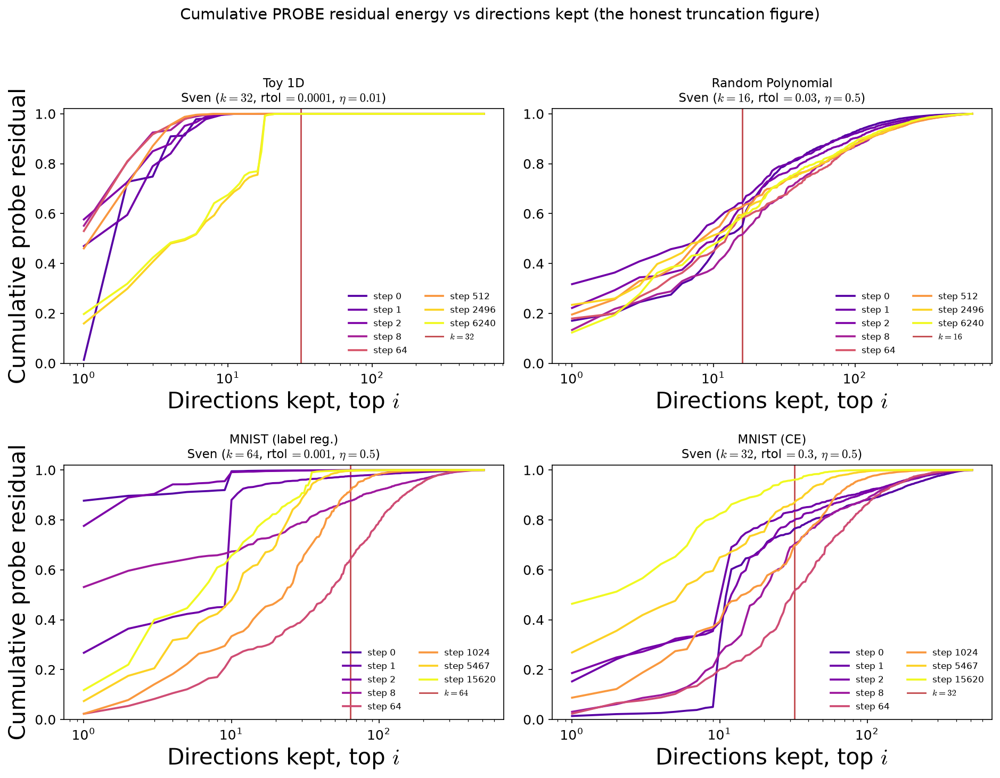

In [24]:
fig, axes = panels(len(PROBE_SCANS), ncol=2, w=6.4, h=4.8)
norm = None
for i, (ax, scan) in enumerate(zip(axes, PROBE_SCANS)):
    d = DIAGS[scan]
    norm = sf.plot_probe_energy_profile(ax, scan, k=d.k, limit=8) or norm
    ax.set_title(f'{d.title}\n{d.label}', fontsize=11)
    ax.legend(fontsize=8, frameon=False, loc='lower right', ncol=2)
    if i % 2:
        ax.set_ylabel('')
fig.suptitle('Cumulative PROBE residual energy vs directions kept '
             '(the honest truncation figure)', y=1.02, fontsize=14)
fig.tight_layout()
print(sf.savefig(fig, PLOT_DIR, 'probe_energy_profile')[0])
plt.show()

In [25]:
print('The two measurements side by side, at the selected k:\n')
for scan, d in DIAGS.items():
    if scan not in PROBE_SCANS or PROBE_ENERGY.empty:
        continue
    sub = PROBE_ENERGY[(PROBE_ENERGY['scan'] == d.title)
                       & (PROBE_ENERGY['k'] == d.k)
                       & (PROBE_ENERGY['when'] == 'last')]
    if not len(sub):
        continue
    online = float(MECH.loc[MECH['scan'] == d.title, 'energy_top_k_final'].iloc[0])
    probe = float(sub['top_k'].iloc[0])
    span = float(sub['in_span'].iloc[0])
    print(f'  {d.title:24s} k={d.k:4d} of B={d.B:4d}:  top-k keeps '
          f'{100 * online:8.4f}% of the BATCH residual  but only '
          f'{100 * probe:7.3f}% of the PROBE residual   (probe span {100 * span:7.3f}%)')
print('\nThe gap is the point: 32 rows can be fitted by k directions in a way 10,000 '
      'rows cannot. A claim about what the truncation discards has to name which of the '
      'two it means.')

The two measurements side by side, at the selected k:

  Toy 1D                   k=  32 of B=  32:  top-k keeps 100.0000% of the BATCH residual  but only 100.000% of the PROBE residual   (probe span 100.000%)
  Random Polynomial        k=  16 of B=  32:  top-k keeps  99.8381% of the BATCH residual  but only  58.820% of the PROBE residual   (probe span  99.490%)
  MNIST (label reg.)       k=  64 of B=  64:  top-k keeps 100.0000% of the BATCH residual  but only  99.868% of the PROBE residual   (probe span 100.000%)
  MNIST (CE)               k=  32 of B=  64:  top-k keeps  99.9981% of the BATCH residual  but only  96.092% of the PROBE residual   (probe span 100.000%)

The gap is the point: 32 rows can be fitted by k directions in a way 10,000 rows cannot. A claim about what the truncation discards has to name which of the two it means.


## 10. Caveats that bound every number above

1. **Different objects.** Online spectra are of a *different random batch* every logged
   step, width $\le B$; probe spectra are of one fixed matrix, width $\min(n_\text{rows},P)$.
   A "fraction of the residual" means a different thing in each and the two differ by up
   to 40 points (polynomial).
2. **The online float32 floor is $\sqrt{\epsilon}\,\sigma_{\max}\approx3.45\times10^{-4}\sigma_{\max}$**,
   not $10^{-7}$: the Gram route squares the condition number. Phase A measured online vs
   offline agreement at ~$5\times10^{-7}$ relative **above** $10^{-2}\sigma_{\max}$, and
   1e-4..1e-3 below it. Nothing below the dashed line in section 3 is a measurement.
3. **Not bit-reproducible across GPU types.** Scans ran mostly on MIG A100-40 GB, the
   diag pass on A100-80 GB.
4. **The diag pass is one configuration per method.** These figures describe the
   *selected* Sven, not Sven in general; section 6's grid is the only place the whole
   $(k,\mathrm{rtol})$ sweep appears.
5. **Robustness.** Sven itself diverges on 688 of 7,825 on-grid runs, concentrated at the
   bottom of each rtol grid (`EXPERIMENTS.md` §7). Every configuration shown here is one
   that finished on all five seeds; that is a selected sample and is stated as such.
6. **Provisional.** Section 2 prints a banner while any scan's selection can still move
   (CIFAR-CE's rtol extension). Re-execute after `tools/select_best.py`.
7. **The offline probe set has a floor too**, at $10^{-12}\sigma_{\max}$ (float64). On toy
   only 14-45 of 593 directions clear it, so `cond` and $\sigma_B/\sigma_1$ are
   threshold artefacts there and are marked as such in §9.2; `eff_rank` is not affected.
8. **Probe spectra are per seed.** §9.1 draws one named model seed per panel; only the
   §9.2 metrics and the §9.4 energy profiles are seed-averaged. No probe spectra exist
   for either CIFAR scan or nanoGPT (cost-bound); those rows are simply absent.
9. **Axes are steps, not logged points.** The dense schedule logs every step to 1,000 and
   then every 20th, so an index-fraction axis is not training progress; §5's discarded-
   energy figure uses `svs_step / n_steps` and smooths over a fixed number of steps.

In [26]:
print(f'{len(DIAGS)} diag passes, {sum(len(a) for a in ARRAYS.values())} Sven runs read')
print(f'{len(PROBE_SCANS)} scans with cached probe spectra: {list(PROBE_SCANS)}')
print(f'\nfigures written to {PLOT_DIR.resolve()} (PDF + PNG):')
for p in sorted(PLOT_DIR.glob('*.pdf')):
    print(f'  {p.name}')

7 diag passes, 35 Sven runs read
4 scans with cached probe spectra: ['toy_1d_scan', 'polynomial_scan', 'mnist_scan_labelRegression', 'mnist_scan_ce']

figures written to /n/home11/sambt/iaifi/sv3/analysis/plots_v2/spectra_analysis (PDF + PNG):
  online_energy_discarded.pdf
  online_energy_kept_vs_step.pdf
  online_energy_profile.pdf
  online_rank_used_per_seed.pdf
  online_rank_used_vs_step.pdf
  online_spectra_over_training.pdf
  online_update_resid_norms.pdf
  online_used_rank_grid.pdf
  online_utr_over_training.pdf
  probe_cond.pdf
  probe_distance_and_norm.pdf
  probe_eff_rank.pdf
  probe_energy_profile.pdf
  probe_sigma_B_over_1.pdf
  probe_spectra_mnist_scan_ce.pdf
  probe_spectra_mnist_scan_labelRegression.pdf
  probe_spectra_polynomial_scan.pdf
  probe_spectra_toy_1d_scan.pdf
